In [1]:
import math
import numpy as np

import cv2
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import plotly.graph_objects as go
import plotly.io as pio
pio.renderers.default='notebook'
%matplotlib inline

import tensorflow as tf
tf.keras.backend.clear_session()
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
tf.debugging.set_log_device_placement(True)

import logging
logger = tf.get_logger()
logger.setLevel(logging.ERROR)

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # FATAL
logging.getLogger('tensorflow').setLevel(logging.FATAL)

Num GPUs Available:  0


In [2]:
print(tf.__version__)

2.1.0


In [3]:
def load_horses_orig(path, image_size):
    mask_path = path + 'masks/'
    image_path = path + 'images/'
    images = []
    masks = []
    test_images = []
    test_masks = []
    
    for i in range(328):
        
        orig_im = cv2.imread(image_path + 'image-{}.png'.format(i))
        orig_im= cv2.cvtColor(orig_im, cv2.COLOR_RGB2BGR)
        
        low_im = cv2.resize(orig_im, dsize=(image_size, image_size))

        orig_mask = cv2.imread(mask_path + 'mask-{}.png'.format(i))
        low_mask = cv2.resize(orig_mask, dsize=(image_size, image_size))
        low_mask = cv2.cvtColor(low_mask, cv2.COLOR_RGB2GRAY)
        bin_mask = (low_mask > 0) + 0
        
        images.append(low_im)
        masks.append(bin_mask)
    
    xtest = np.reshape(np.array(images[250:]), (-1,image_size, image_size, 3))
    ytest = np.reshape(np.array(masks[250:]), (-1, image_size, image_size, 1))
    xdata = np.reshape(np.array(images[:200]), (-1,image_size, image_size, 3))
    ydata = np.reshape(np.array(masks[:200]), (-1, image_size, image_size, 1))
    yval =  np.reshape(np.array(masks[200:250]), (-1, image_size, image_size, 1))
    xval = np.reshape(np.array(images[200:250]), (-1,image_size, image_size, 3))
    return xdata, xval, xtest, ydata, yval, ytest

In [4]:
#change the path address 
path = './horses/'
image_size = 32
xdata, xval, xtest, ydata, yval, ytest = load_horses_orig(path, image_size)

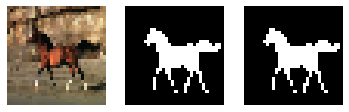

(32, 32, 3) (32, 32, 1)


In [5]:
def draw(image, mask):
    fig, (ax1,ax2) = plt.subplots(1,2) 
    ax1.axis('off')
    ax2.axis('off')
    ax1.imshow(np.reshape(image, (image_size,image_size,3)))
    ax2.imshow(np.reshape(mask, (image_size,image_size)), cmap=plt.cm.gray)
    plt.show()

def draw_all(image, real_mask, fake_mask):
    fig, (ax1,ax2,ax3) = plt.subplots(1,3)
    ax1.axis('off')
    ax2.axis('off')
    ax3.axis('off')
    ax1.imshow(image)
    ax2.imshow(real_mask, cmap=plt.cm.gray)
    ax3.imshow(fake_mask, cmap=plt.cm.gray)
    plt.show()
    
draw_all(xdata[0], ydata[0], ydata[0])
print(xdata[0].shape, ydata[0].shape)

In [6]:
# Do not change this cell
def iou(ytrue, yprediction):
    yp = yprediction
    yt = ytrue
    yp = yp > 0.5 + 0
    intersect = np.sum(np.minimum(yp, yt))
    union = np.sum(np.maximum(yp, yt))
    return np.average(intersect / (union+0.0))

In [7]:
assert iou(ydata, ydata) == 1.0

# CNN GAN

In [8]:
class Discriminator(tf.keras.Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.concat_layer = tf.keras.layers.Concatenate(axis=3)
        
        self.conv1 = tf.keras.layers.Conv2D(1, 3, 2, activation = tf.nn.softplus)
        self.conv2 = tf.keras.layers.Conv2D(32, 3, 2, activation = tf.nn.softplus)
        self.conv3 = tf.keras.layers.Conv2D(64, 3, 2, activation = tf.nn.softplus)
        self.conv4 = tf.keras.layers.Conv2D(128, 3, 2, activation = tf.nn.softplus)
        
        self.flatten = tf.keras.layers.Flatten()
        self.fc_score = tf.keras.layers.Dense(1)

    def call(self, x, yt, y):
        x = tf.cast(x, tf.float32)
        yt = tf.cast(yt, tf.float32)
        y = tf.cast(y, tf.float32)

        x = self.concat_layer([x, yt, y])
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.flatten(x)
        x = self.fc_score(x)
        return x

class Generator(tf.keras.Model):
    def __init__(self):
        super(Generator, self).__init__()

        self.concat_layer = tf.keras.layers.Concatenate(axis=3)
        self.conv1 = tf.keras.layers.Conv2DTranspose(128, 3, 2, activation = tf.nn.softplus, padding = 'same')
        self.conv2 = tf.keras.layers.Conv2DTranspose(64, 3, 2, activation = tf.nn.softplus, padding = 'same')
        self.conv3 = tf.keras.layers.Conv2DTranspose(32, 3, 2, activation = tf.nn.softplus, padding = 'same')
        self.conv4 = tf.keras.layers.Conv2DTranspose(1, 3, 2, activation = tf.nn.softplus, padding = 'same')
        
        self.flatten = tf.keras.layers.Flatten()
        self.fc_energy = tf.keras.layers.Dense(1)
        
    def call(self, x, z):
        x = tf.cast(x, tf.float32)
        x = self.concat_layer([x, z])
        
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.flatten(x)
        x = self.fc_energy(x)
        return x

# Unrolled Inference

In [9]:
def compute_gradient(x, y):
    y = tf.Variable(y)
    with tf.GradientTape() as t:
        t.watch(y)
        energy = gen(x, y)
    return t.gradient(energy, y)

def unrolled_inf(images, fake_label, inf_iter, inf_rate):
    yp_ind = fake_label;    y_start = yp_ind;     current_yp_ind = y_start
    
    yp_ar = []
    for i in range(inf_iter):
        gradients = compute_gradient(images, yp_ind)
        
        next_yp_ind = tf.math.add(current_yp_ind, tf.math.multiply(inf_rate, gradients))
        
        # Langevin dynamics
        temp = tf.cast(inf_rate/2, tf.float32)
        temp = temp * gradients + tf.random.normal(gradients.get_shape().as_list(), mean=0, stddev=inf_rate)
        next_yp_ind = next_yp_ind + temp
        current_yp_ind = next_yp_ind
        
        yp_ind = current_yp_ind
        yp_ar.append(yp_ind)
        
    yp = yp_ar[-1]
    yp = tf.nn.sigmoid(yp)
    return yp

def test_time_inf(images, fake_label, inf_iter, inf_rate):
    yp_ind = fake_label;    y_start = yp_ind;     current_yp_ind = y_start
    
    yp_ar = []
    for i in range(inf_iter):
        gradients = compute_gradient(images, yp_ind)
        
        next_yp_ind = tf.math.add(current_yp_ind, tf.math.multiply(inf_rate, gradients))
        
        # Langevin dynamics
        temp = tf.cast(inf_rate/2, tf.float32)
        temp = temp * gradients
        next_yp_ind = next_yp_ind + temp
        current_yp_ind = next_yp_ind
        
        yp_ind = current_yp_ind
        yp_ar.append(yp_ind)
        
    yp = yp_ar[-1]
    yp = tf.nn.sigmoid(yp)
    return yp

# Visualization

In [10]:
def plot_figure(loss, arange, brange, start, end, step, plot_name):
    axis_length = len(np.linspace(start, end, step))
    loss = loss.numpy().reshape(-1, axis_length)

    # plot the surface plot with plotly's Surface
    fig = go.Figure(data=go.Surface(z=loss,
                                    x=arange,
                                    y=brange))

    # add a countour plot
    fig.update_traces(contours_z=dict(show=True, usecolormap=True,
                                      highlightcolor="limegreen", project_z=True))

    # annotate the plot
    fig.update_layout(title=plot_name,
                      scene=dict(
                        xaxis_title='Pred. Label Axis-0',
                        yaxis_title='Pred. Label Axis-1',
                        zaxis_title=plot_name),
                      width=700, height=700)

    fig.show()
    
def generate_vectors(real_image, real_label, fake_label, start, end, step):
    arange = np.linspace(start, end, step)
    brange = np.linspace(start, end, step)

    alen = arange.shape[0]
    blen = brange.shape[0]

    r1 = np.random.uniform(0, 1, (fake_label.shape[0], image_size * image_size))
    r1[:,0] = 1 - r1[:,1]
    r2 = np.random.uniform(0, 1, (fake_label.shape[0], image_size * image_size))
    r2[:,0] = 1 - r2[:,1]
    
    y_img = np.zeros((alen*blen, fake_label.shape[0], image_size * image_size * 3))
    y_pred = np.zeros((alen*blen, fake_label.shape[0], image_size * image_size))
    y_true = np.zeros((alen*blen, fake_label.shape[0], image_size * image_size))
    for b in range(0,blen):
        for a in range(0,alen):
            k = arange[a]
            l = brange[b]
            y_pred[b*alen+a] = tf.clip_by_value(fake_label[0, :] + l*r1[0, :] + k*r2[0, :], 0.0, 1.0) # just one horse
            y_true[b*alen+a] = real_label[0, :]
            y_img[b*alen+a] = real_image[0, :]
    return arange, brange, y_img, y_pred, y_true

def plot_contour_ce(real_image, real_label, inf_iter, inf_rate, start, end, step):
    batch_size = real_label.shape[0]
    z = tf.random.uniform([batch_size, image_size, image_size, 1], 0.0, 1.0)
    fake_label = test_time_inf(real_image, z, inf_iter, inf_rate)
    
    fake_label = np.array(fake_label).reshape(-1, image_size * image_size)
    real_label = np.array(real_label).reshape(-1, image_size * image_size)
    real_image = np.array(real_image).reshape(-1, image_size * image_size * 3)

    arange, brange, y_img, y_pred, y_true = generate_vectors(real_image, real_label, fake_label, start, end, step)

    # CE Loss
    loss = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    plot_figure(loss, arange, brange, start, end, step, 'Cross Entropy')
    
    
def plot_contour_adv(real_image, real_label, inf_iter, inf_rate, start, end, step):
    batch_size = real_label.shape[0]
    z = tf.random.uniform([batch_size, image_size, image_size, 1], 0.0, 1.0)
    fake_label = test_time_inf(real_image, z, inf_iter, inf_rate)
    
    fake_label = np.array(fake_label).reshape(-1, image_size * image_size)
    real_label = np.array(real_label).reshape(-1, image_size * image_size)
    real_image = np.array(real_image).reshape(-1, image_size * image_size * 3)
    
    # Adv loss
    arange, brange, y_img, y_pred, y_true = generate_vectors(real_image, real_label, fake_label, start, end, step)
    
    real_image = y_img.reshape(-1, image_size, image_size, 3)
    real_label = y_true.reshape(-1, image_size, image_size, 1)
    fake_label = y_pred.reshape(-1, image_size, image_size, 1)
    
    # disc signals
    real_score = dis(real_image, real_label, real_label)
    fake_score = dis(real_image, real_label, fake_label)

    # interpolate
    alpha_ = tf.random.uniform([fake_label.shape[0], 1, 1, 1], 0.0, 1.0)
    inter_sample = fake_label * alpha_ + real_label * (1 - alpha_)
    with tf.GradientTape() as tape_gp:
        tape_gp.watch(inter_sample)
        inter_score = dis(real_image, real_label, inter_sample)
    gp_gradients = tape_gp.gradient(inter_score, inter_sample)
    
    # gradient penalty
    gp_gradients_norm = tf.sqrt(tf.reduce_sum(tf.square(gp_gradients), axis = [1, 2, 3]))
    gp = tf.reduce_mean((gp_gradients_norm - 1.0) ** 2)

    # loss
    loss = fake_score - real_score + (gp * 10)
    plot_figure(loss, arange, brange, start, end, step, 'Adversarial loss')
    
    
def plot_hist(fake, real):
    fake = np.array(fake).reshape(-1, 1)
    real = np.array(real).reshape(-1, 1)
    bins = len(fake)
    plt.figure(figsize=(15,5))
    plt.hist(fake, bins, alpha=0.5, color='blue', label='Fake')
    plt.hist(real, bins, alpha=0.5, color='orange', label='Real')
    plt.legend(loc='upper right')
    plt.show()
    
def calc_iou(images, labels, inf_iter, inf_rate):
    batch_size = labels.shape[0]
    z = tf.random.uniform([batch_size, image_size, image_size, 1], 0.0, 1.0)
    fake_label = test_time_inf(images, z, inf_iter, inf_rate)
    return iou(labels, fake_label)

def draw_test(images, labels, inf_iter, inf_rate, name):
    batch_size = labels.shape[0]
    z = tf.random.uniform([batch_size, image_size, image_size, 1], 0.0, 1.0)
    fake_label = test_time_inf(images, z, inf_iter, inf_rate)
    iou_score = iou(labels, fake_label)
    print('\n' + name + ' iou_score %:', round(iou_score*100, 2))
    
    for i in range(10):
        draw_all(images[i], labels[i], fake_label[i])
        
def plot_iou(epoch, train_iou, val_iou, test_iou):
    plt.plot(np.arange(epoch+1), np.array(train_iou), label = "train")
    plt.plot(np.arange(epoch+1), np.array(val_iou), label = "test")
    plt.plot(np.arange(epoch+1), np.array(test_iou), label = "valid")
    plt.xlabel('Epoch')
    plt.ylabel('IOU Score')
    plt.legend()
    plt.show()

# Training Functions

In [11]:
def train_step_gen(real_image, real_label, inf_iter, inf_rate, pt_loss, alpha):
    batch_size = real_image.get_shape().as_list()[0]
    z = tf.random.uniform([batch_size, image_size, image_size, 1], 0.0, 1.0)
    real_label = tf.cast(real_label, dtype=tf.float32)
    with tf.GradientTape() as tape:
        fake_label = unrolled_inf(real_image, z, inf_iter, inf_rate)
        fake_score = dis(real_image, real_label, fake_label)
        loss = tf.reduce_mean(fake_score) + (pt_loss * alpha)
    gradients = tape.gradient(loss, gen.trainable_variables)
    gen_opt.apply_gradients(zip(gradients, gen.trainable_variables))
    gen_loss(loss)

def train_step_dis(real_image, real_label, inf_iter, inf_rate):
    batch_size = real_image.get_shape().as_list()[0]
    real_label = tf.cast(real_label, dtype=tf.float32)
    z = tf.random.uniform([batch_size, image_size, image_size, 1], 0.0, 1.0)
        
    with tf.GradientTape() as tape:
        fake_label = unrolled_inf(real_image, z, inf_iter, inf_rate)
        real_score = dis(real_image, real_label, real_label)
        fake_score = dis(real_image, real_label, fake_label)
        
        alpha_ = tf.random.uniform([batch_size, 1, 1, 1], 0.0, 1.0)
        inter_sample = fake_label * alpha_ + real_label * (1 - alpha_)
        
        with tf.GradientTape() as tape_gp:
            tape_gp.watch(inter_sample)
            inter_score = dis(real_image, real_label, inter_sample)
        gp_gradients = tape_gp.gradient(inter_score, inter_sample)
        
        # gradient penalty
        gp_gradients_norm = tf.sqrt(tf.reduce_sum(tf.square(gp_gradients), axis = [1, 2, 3]))
        gp = tf.reduce_mean((gp_gradients_norm - 1.0) ** 2)
        
        # adv loss
        loss = tf.reduce_mean(fake_score) - tf.reduce_mean(real_score) + (gp * 10)
    
    gradients = tape.gradient(loss, dis.trainable_variables)
    dis_opt.apply_gradients(zip(gradients, dis.trainable_variables))
    
    dis_loss(loss)
    adv_loss(loss - gp * 10)
    return fake_score, real_score
    
def pretrain_gen(real_image, real_label, inf_iter, inf_rate):
    batch_size = real_image.get_shape().as_list()[0]
    real_label = tf.cast(real_label, dtype=tf.float32)
    z = tf.random.uniform([batch_size, image_size, image_size, 1], 0.0, 1.0)
    with tf.GradientTape() as tape:
        fake_label = unrolled_inf(real_image, z, inf_iter, inf_rate)
        loss = tf.reduce_mean(tf.keras.losses.binary_crossentropy(real_label, fake_label))
    gradients = tape.gradient(loss, gen.trainable_variables)
    gen_opt_pt.apply_gradients(zip(gradients, gen.trainable_variables))
    gen_pretrain_loss(loss)
    return loss

def train(data, n_epoch, n_update_dis, inf_iter, inf_rate, pt_gen, alpha):
    train_iou = []; val_iou = []; test_iou = [];
    for epoch in range(n_epoch):
        print('\nepoch:', epoch)
        
        if epoch == 0:
            pt_loss = 0
        
        fake_store = [];   real_store = [];
        for images, labels in train_dataset:
            
            # train gen
            if epoch > 0:
                if pt_gen:
                    pt_loss = pretrain_gen(images, labels, inf_iter, inf_rate)
                train_step_gen(images, labels, inf_iter, inf_rate, pt_loss, alpha)
            
            # train disc
            for i in range(n_update_dis):
                fake_sc, real_sc = train_step_dis(images, labels, inf_iter, inf_rate)
            fake_store.append(fake_sc.numpy())
            real_store.append(real_sc.numpy())
            
        # store iou progression
        train_iou.append(calc_iou(xdata, ydata, inf_iter, inf_rate))
        val_iou.append(calc_iou(xtest, ytest, inf_iter, inf_rate))
        test_iou.append(calc_iou(xval, yval, inf_iter, inf_rate))
        
        if epoch % 20 == 0:
            plot_hist(fake_store, real_store)
            
            start, end, step = 0.0, 20.0, 10
            plot_contour_ce(xtest, ytest, inf_iter, inf_rate, start, end, step)
            
            start, end, step = -200.0, 100.0, 10
            plot_contour_adv(xtest, ytest, inf_iter, inf_rate, start, end, step)

            draw_test(xdata, ydata, inf_iter, inf_rate, 'train')
            draw_test(xtest, ytest, inf_iter, inf_rate, 'test')
            draw_test(xval, yval, inf_iter, inf_rate, 'valid')
            
            plot_iou(epoch, train_iou, val_iou, test_iou)
                
        template = 'PT Gen Loss: {}, Gen Loss: {}, Dis Loss: {}, Adv Loss: {}'
        print (template.format(gen_pretrain_loss.result(), gen_loss.result(), dis_loss.result(), adv_loss.result()))
        dis_loss.reset_states()
        adv_loss.reset_states()
        gen_loss.reset_states()
        gen_pretrain_loss.reset_states()

# Deploy Network

Executing op TensorSliceDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousRandomSeedGenerator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ShuffleDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op BatchDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0

epoch: 0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0

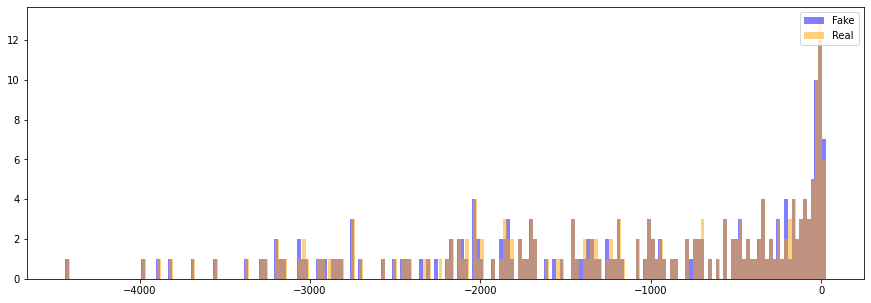

Executing op Minimum in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Maximum in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Log in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Neg in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Cast in device /job:localhost/replica:0/task:0/device:GPU:0



train iou_score %: 26.0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0


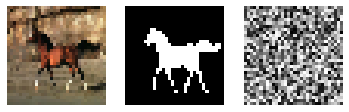

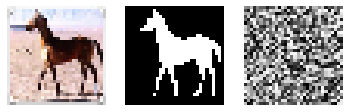

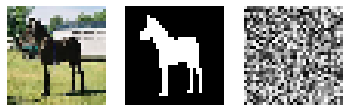

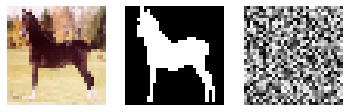

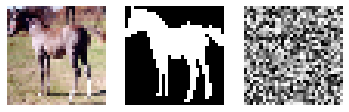

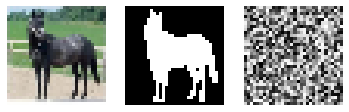

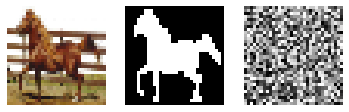

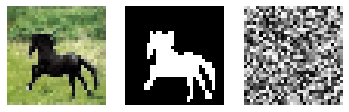

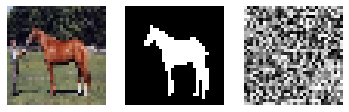

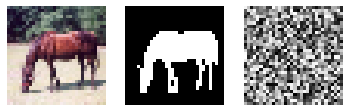


test iou_score %: 29.3


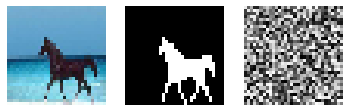

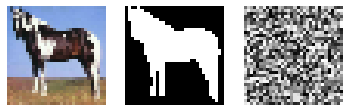

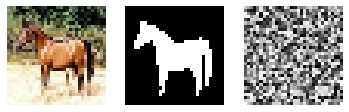

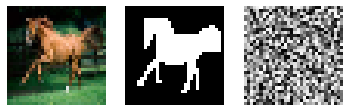

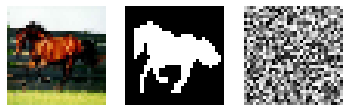

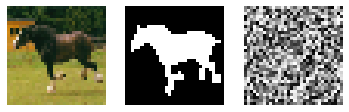

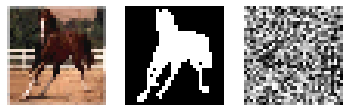

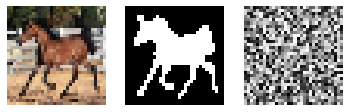

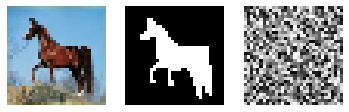

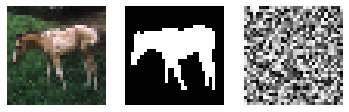


valid iou_score %: 28.32


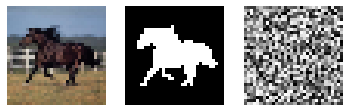

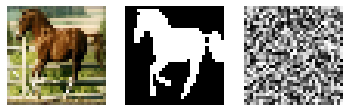

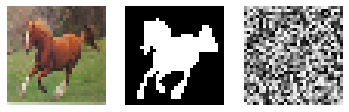

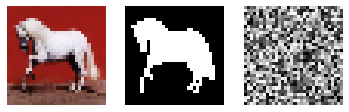

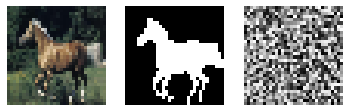

...

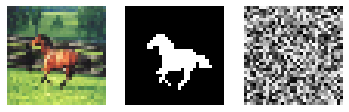

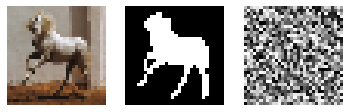

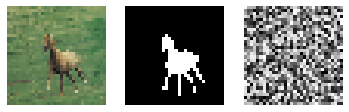

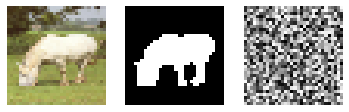

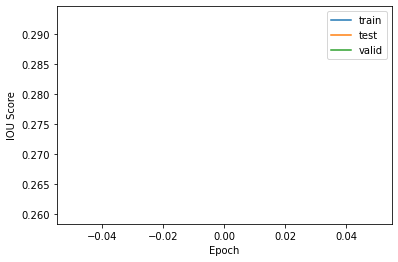

PT Gen Loss: 0.0, Gen Loss: 0.0, Dis Loss: -2.385688304901123, Adv Loss: -3.5654571056365967

epoch: 1
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Minimum in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Maximum in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Log in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Reciprocal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ZerosLike in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GreaterEqual in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op SelectV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LessEqual in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddN in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:lo

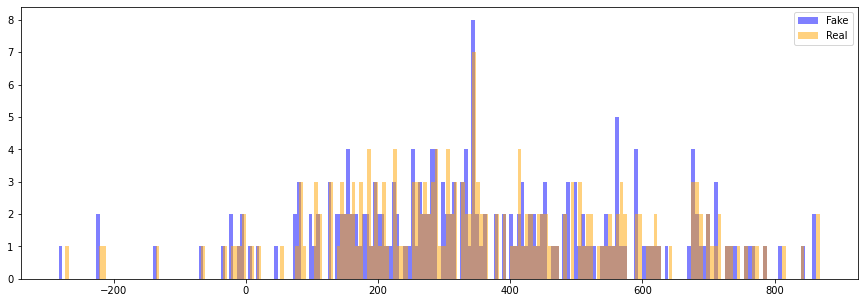


train iou_score %: 72.04


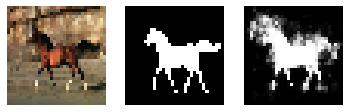

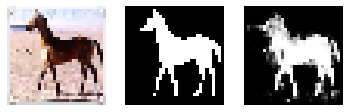

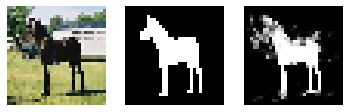

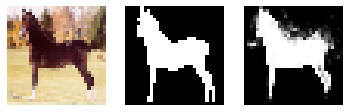

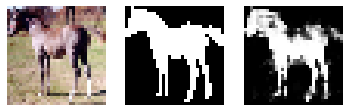

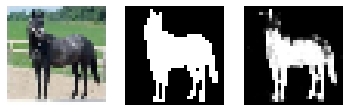

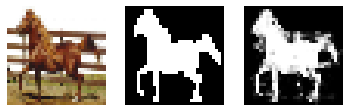

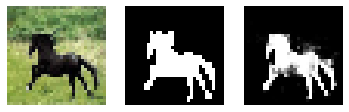

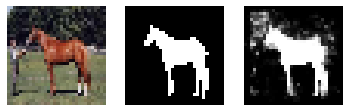

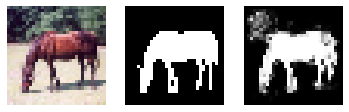


test iou_score %: 63.9


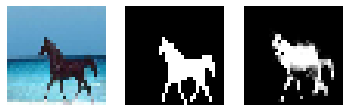

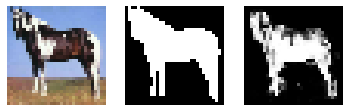

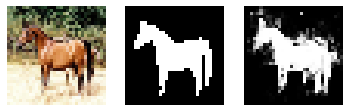

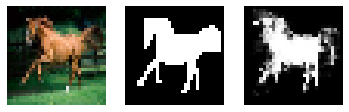

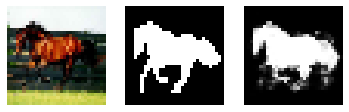

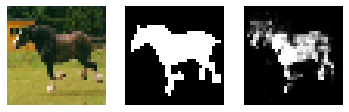

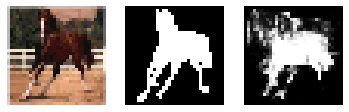

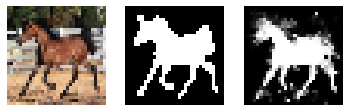

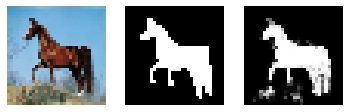

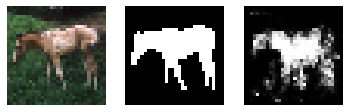


valid iou_score %: 58.82


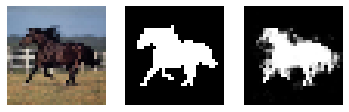

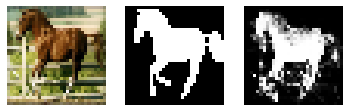

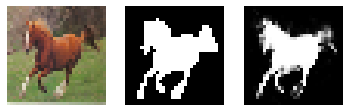

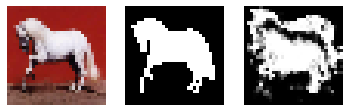

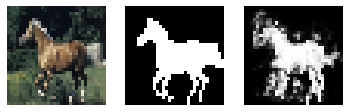

...

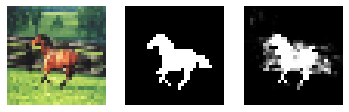

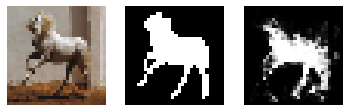

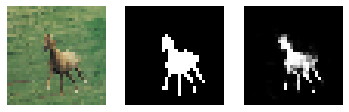

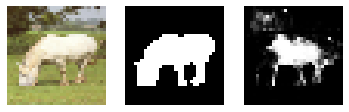

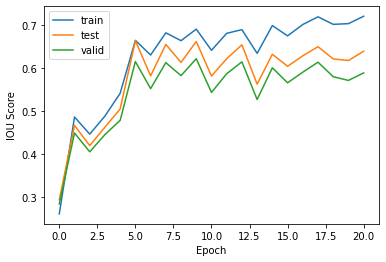

PT Gen Loss: 0.309876024723053, Gen Loss: 355.3967590332031, Dis Loss: -2.987086534500122, Adv Loss: -3.2587995529174805

epoch: 21
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.3081482946872711, Gen Loss: 348.39715576171875, Dis Loss: -3.0133023262023926, Adv Loss: -3.2892279624938965

epoch: 22
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.30392760038375854, Gen Loss: 260.0592346191406, Dis Loss: -2.8747432231903076, Adv Loss: -3.1308090686798096

epoch: 23
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.2987229824066162, Gen Loss: 133.36929321289062, Dis Loss: -3.128727436065674, Adv Loss: 

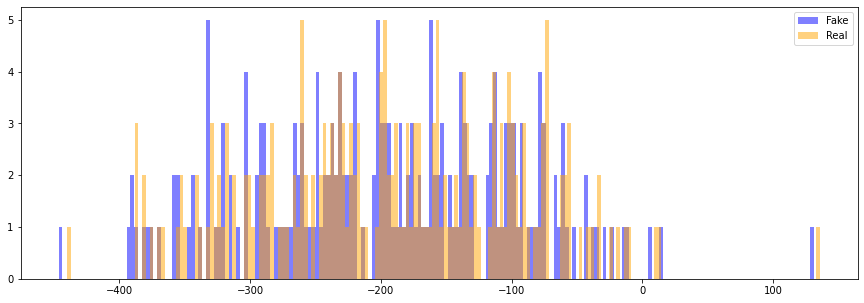


train iou_score %: 82.05


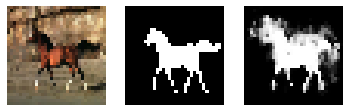

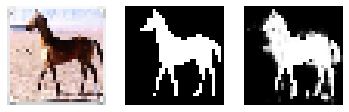

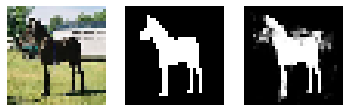

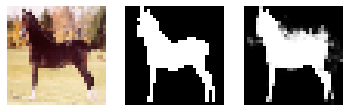

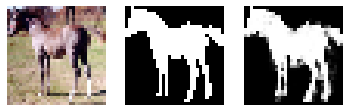

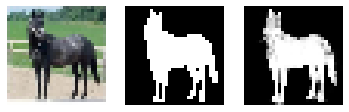

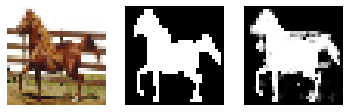

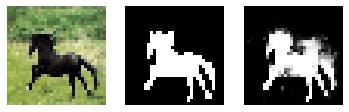

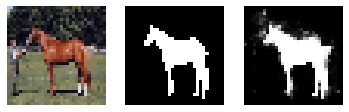

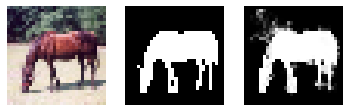


test iou_score %: 67.96


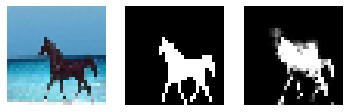

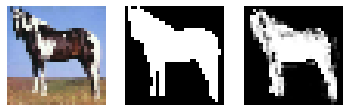

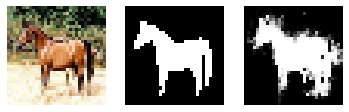

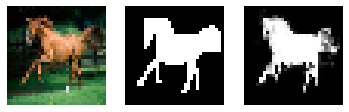

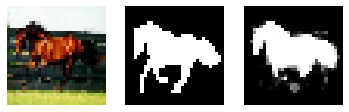

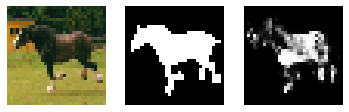

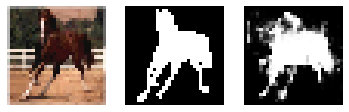

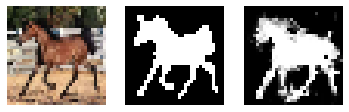

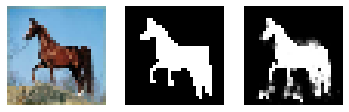

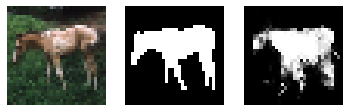


valid iou_score %: 65.37


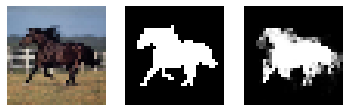

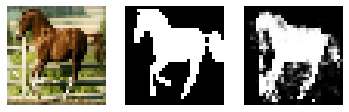

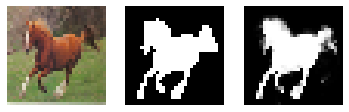

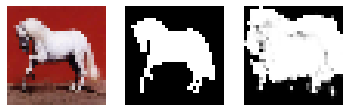

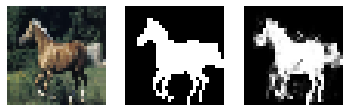

...

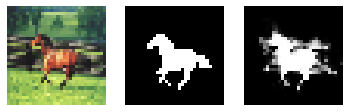

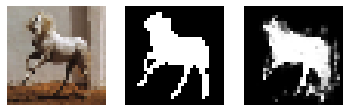

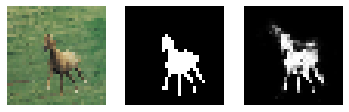

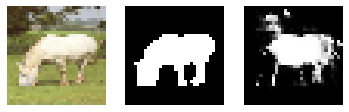

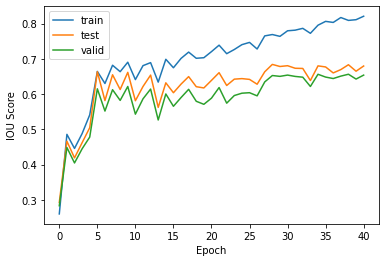

PT Gen Loss: 0.21552275121212006, Gen Loss: -195.62167358398438, Dis Loss: -3.0401341915130615, Adv Loss: -3.304225206375122

epoch: 41
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.19559821486473083, Gen Loss: -185.43878173828125, Dis Loss: -2.99354887008667, Adv Loss: -3.231785535812378

epoch: 42
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.18798106908798218, Gen Loss: -150.90878295898438, Dis Loss: -2.9215567111968994, Adv Loss: -3.1631922721862793

epoch: 43
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.19199873507022858, Gen Loss: -147.92852783203125, Dis Loss: -2.913174629211426, Adv

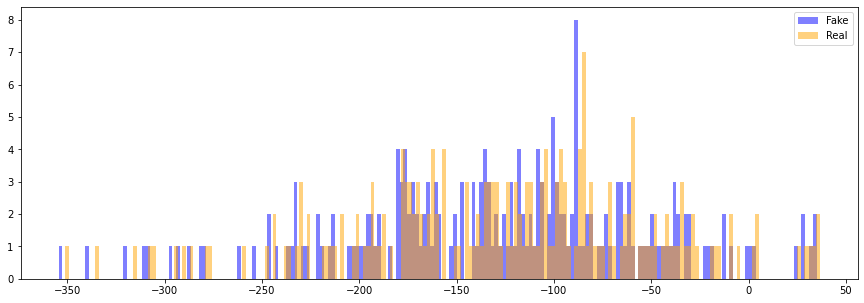


train iou_score %: 85.99


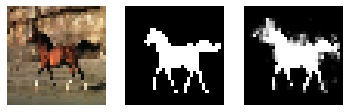

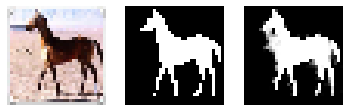

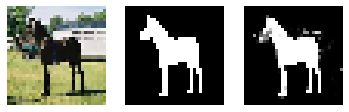

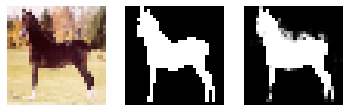

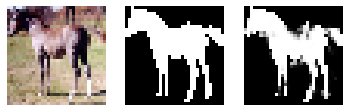

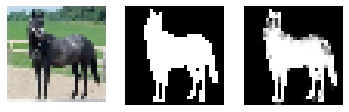

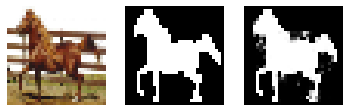

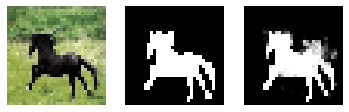

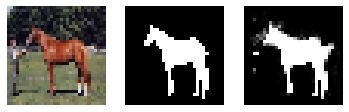

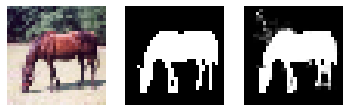


test iou_score %: 66.38


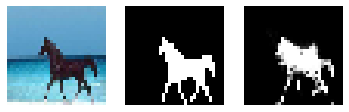

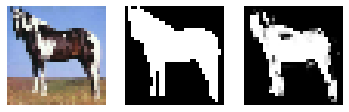

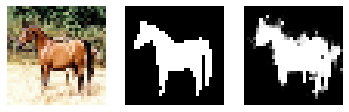

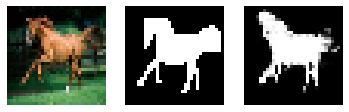

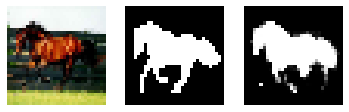

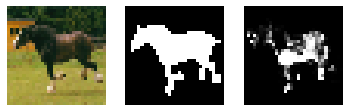

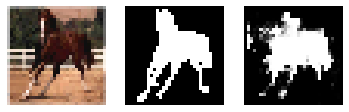

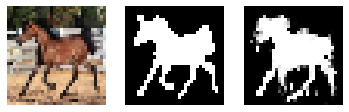

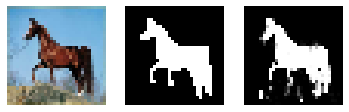

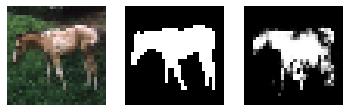


valid iou_score %: 63.16


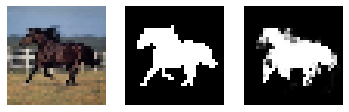

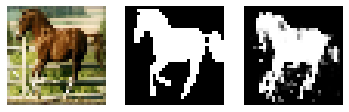

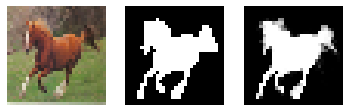

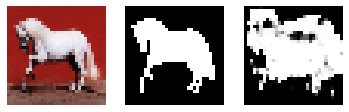

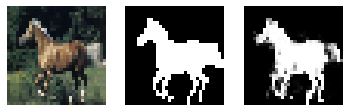

...

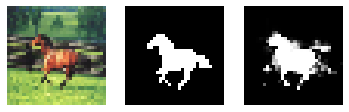

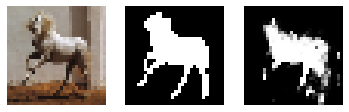

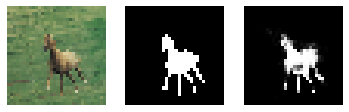

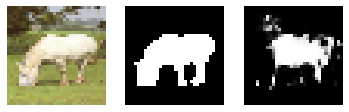

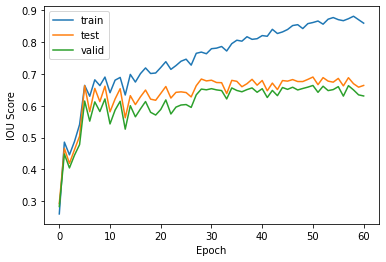

PT Gen Loss: 0.14639133214950562, Gen Loss: -128.2811279296875, Dis Loss: -2.599601984024048, Adv Loss: -2.789422035217285

epoch: 61
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.13973090052604675, Gen Loss: -103.49718475341797, Dis Loss: -2.5114219188690186, Adv Loss: -2.691547393798828

epoch: 62
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.13183629512786865, Gen Loss: -106.79756927490234, Dis Loss: -2.4976277351379395, Adv Loss: -2.6687746047973633

epoch: 63
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.13225138187408447, Gen Loss: -125.12450408935547, Dis Loss: -2.4365153312683105, Ad

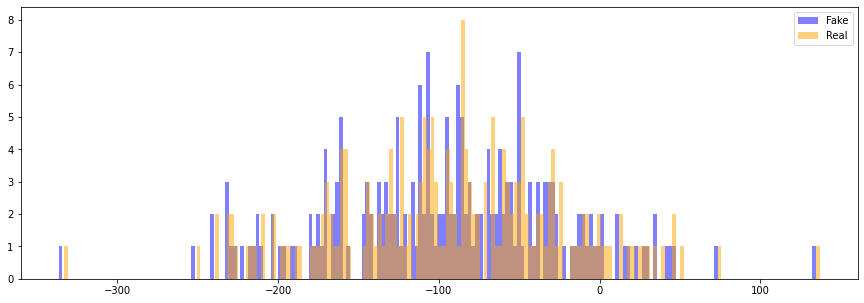


train iou_score %: 90.64


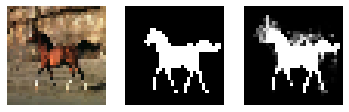

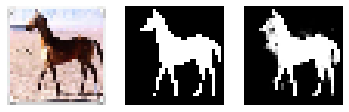

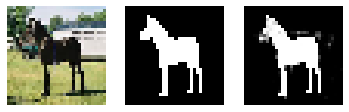

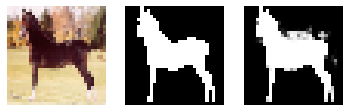

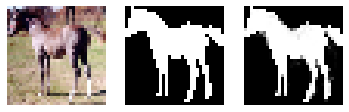

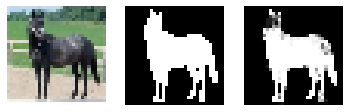

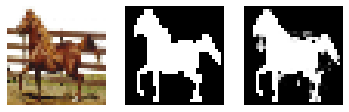

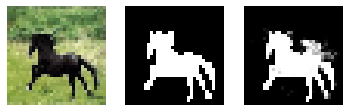

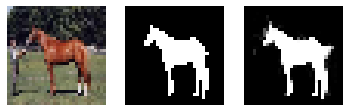

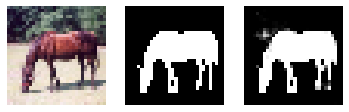


test iou_score %: 66.94


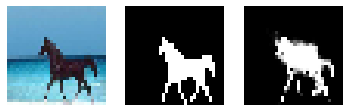

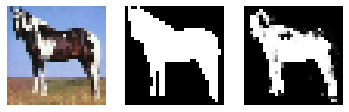

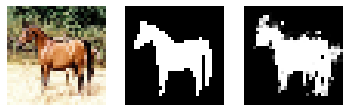

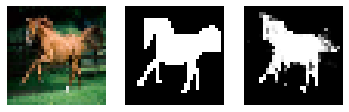

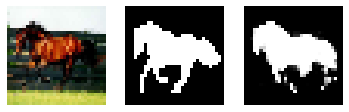

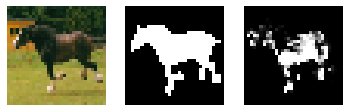

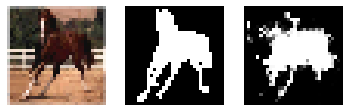

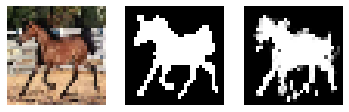

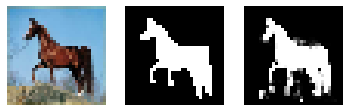

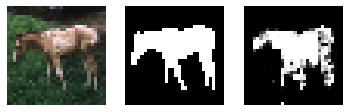


valid iou_score %: 64.95


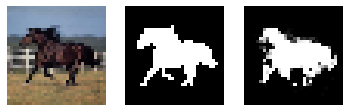

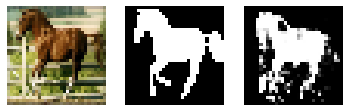

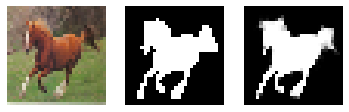

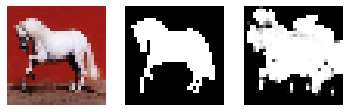

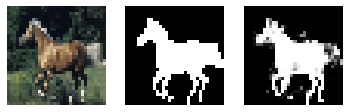

...

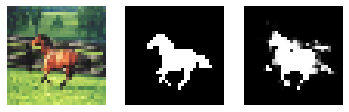

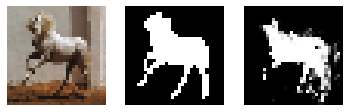

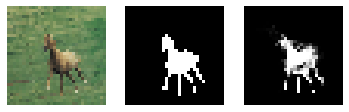

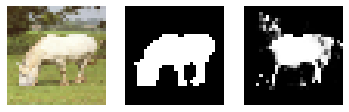

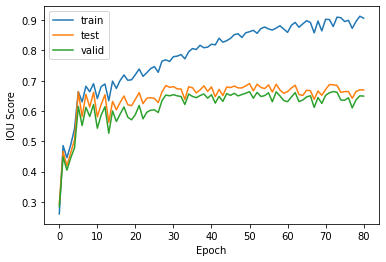

PT Gen Loss: 0.11059930920600891, Gen Loss: -96.09030151367188, Dis Loss: -2.3027100563049316, Adv Loss: -2.461914539337158

epoch: 81
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.10060606896877289, Gen Loss: -88.780029296875, Dis Loss: -2.2962393760681152, Adv Loss: -2.453258752822876

epoch: 82
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.09839537739753723, Gen Loss: -73.70283508300781, Dis Loss: -2.226716995239258, Adv Loss: -2.3727474212646484

epoch: 83
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.09775478392839432, Gen Loss: -84.58436584472656, Dis Loss: -2.208317518234253, Adv Loss

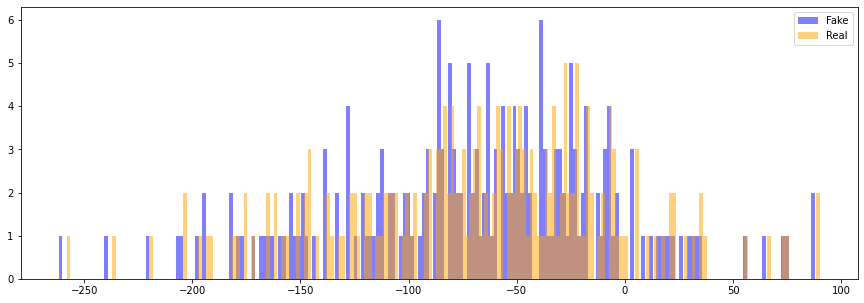


train iou_score %: 93.3


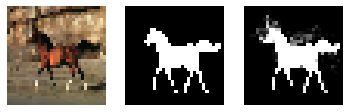

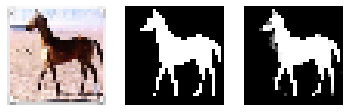

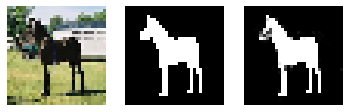

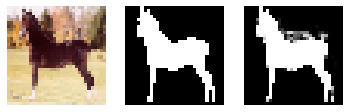

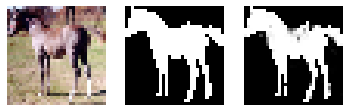

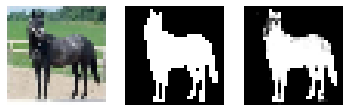

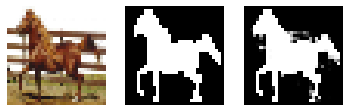

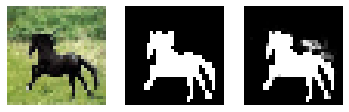

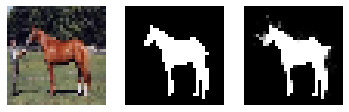

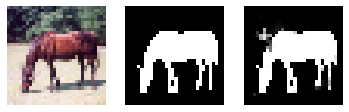


test iou_score %: 66.22


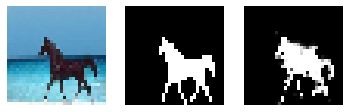

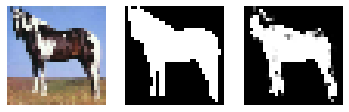

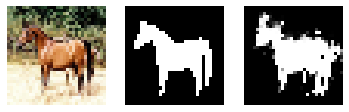

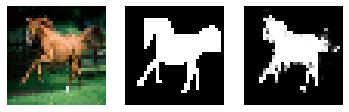

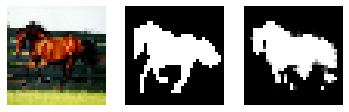

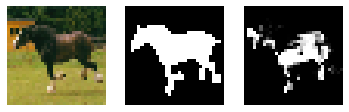

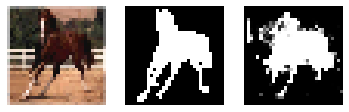

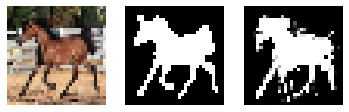

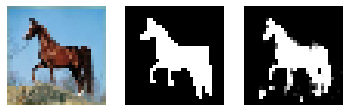

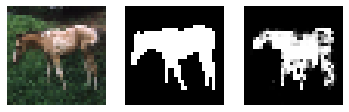


valid iou_score %: 63.46


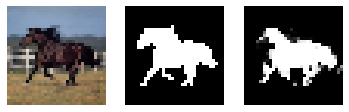

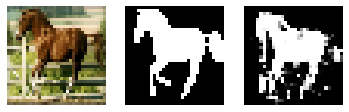

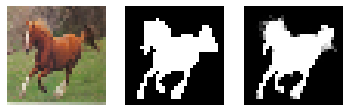

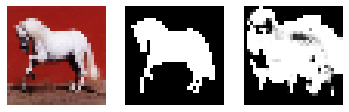

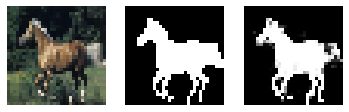

...

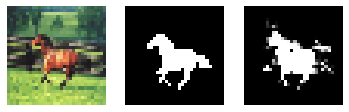

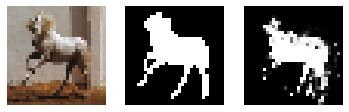

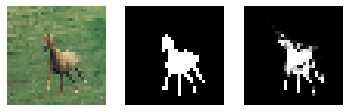

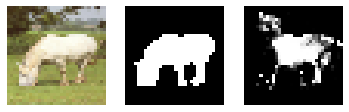

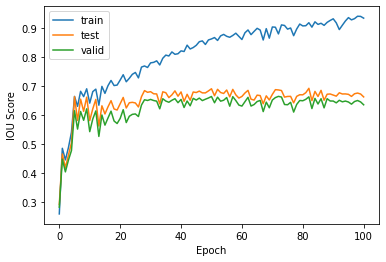

PT Gen Loss: 0.07767162472009659, Gen Loss: -67.84571838378906, Dis Loss: -2.0496468544006348, Adv Loss: -2.1806206703186035

epoch: 101
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.091737300157547, Gen Loss: -77.2642822265625, Dis Loss: -2.1608426570892334, Adv Loss: -2.292435884475708

epoch: 102
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.08701536804437637, Gen Loss: -76.73158264160156, Dis Loss: -2.1269636154174805, Adv Loss: -2.264298439025879

epoch: 103
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.07790705561637878, Gen Loss: -75.33299255371094, Dis Loss: -2.0270001888275146, Adv 

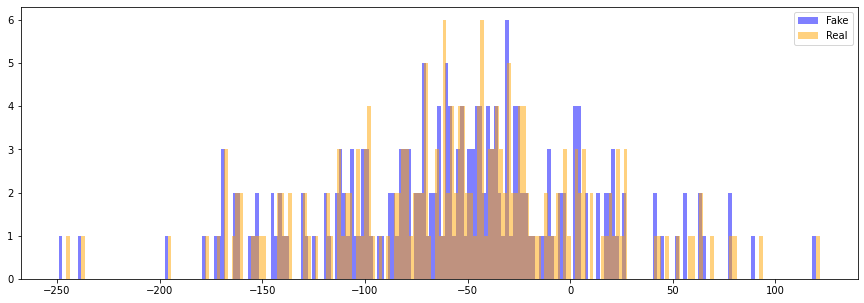


train iou_score %: 92.49


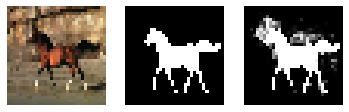

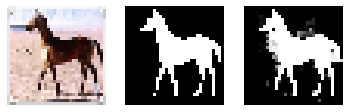

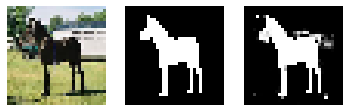

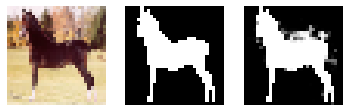

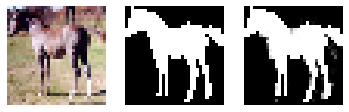

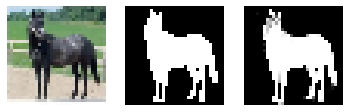

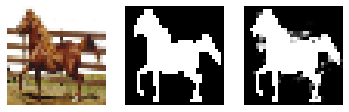

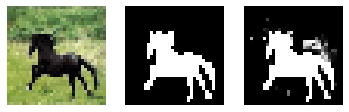

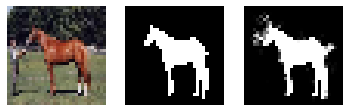

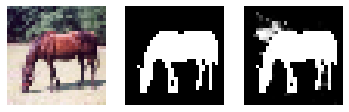


test iou_score %: 68.21


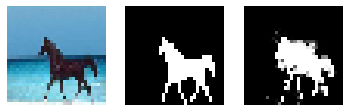

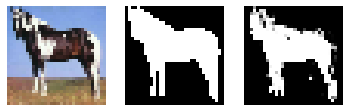

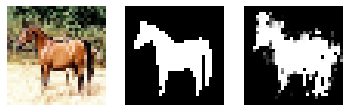

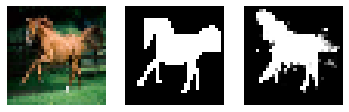

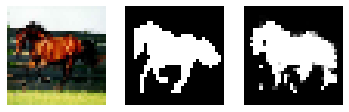

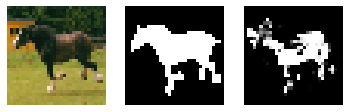

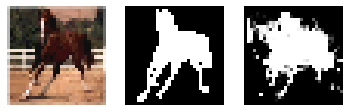

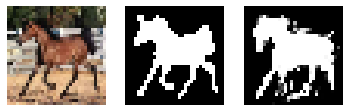

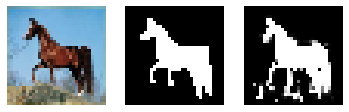

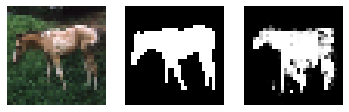


valid iou_score %: 64.99


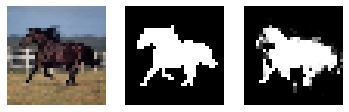

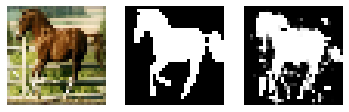

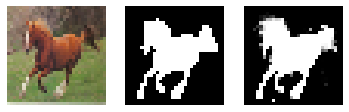

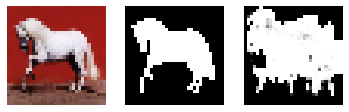

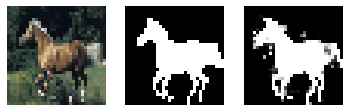

...

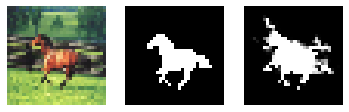

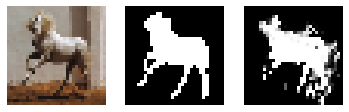

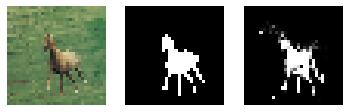

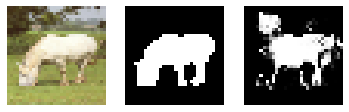

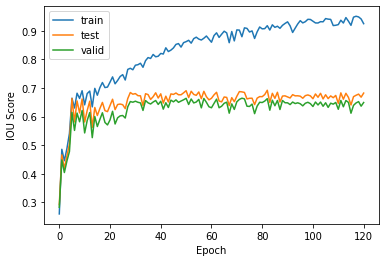

PT Gen Loss: 0.06591375172138214, Gen Loss: -56.42060089111328, Dis Loss: -1.908619999885559, Adv Loss: -2.02276873588562

epoch: 121
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.06714574992656708, Gen Loss: -56.37911605834961, Dis Loss: -1.8793120384216309, Adv Loss: -1.9856963157653809

epoch: 122
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.06340276449918747, Gen Loss: -46.00996398925781, Dis Loss: -1.8379062414169312, Adv Loss: -1.9459820985794067

epoch: 123
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.06699410080909729, Gen Loss: -46.106197357177734, Dis Loss: -1.7692761421203613, A

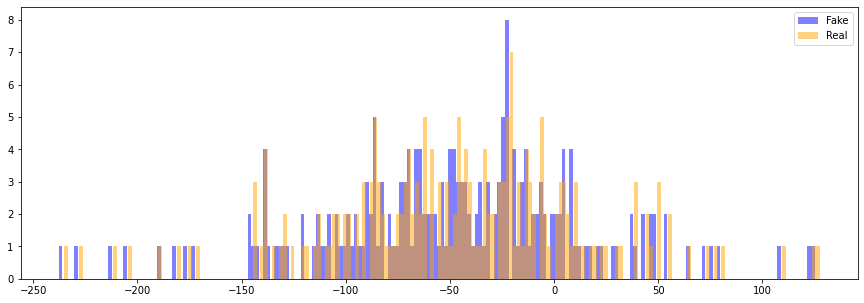


train iou_score %: 95.73


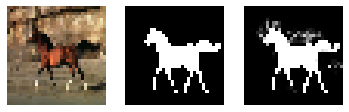

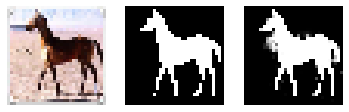

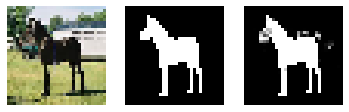

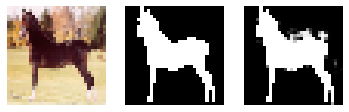

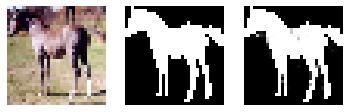

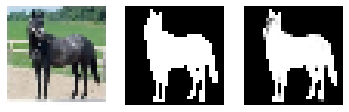

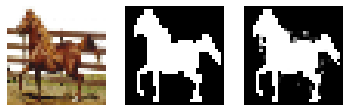

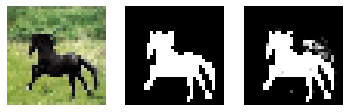

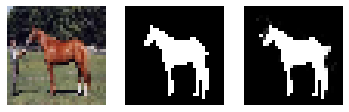

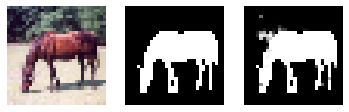


test iou_score %: 67.22


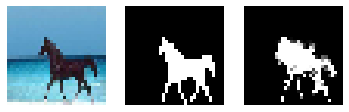

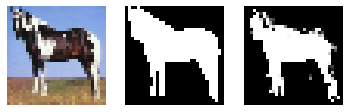

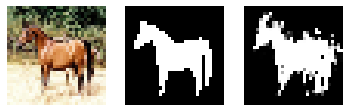

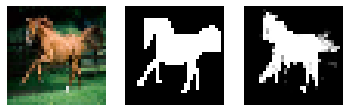

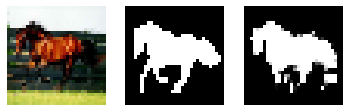

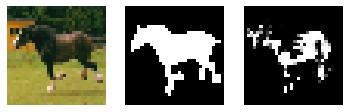

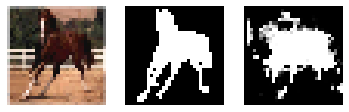

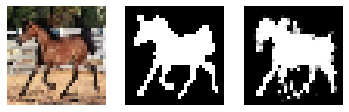

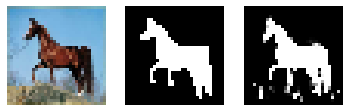

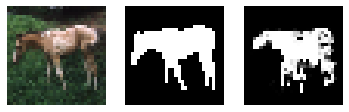


valid iou_score %: 64.89


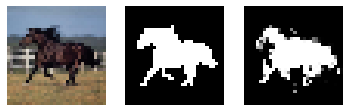

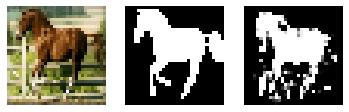

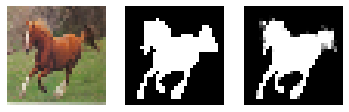

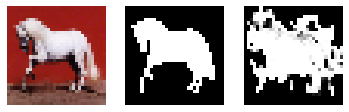

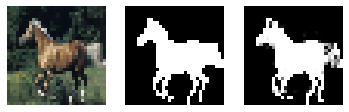

...

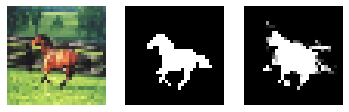

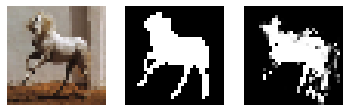

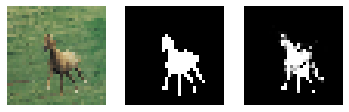

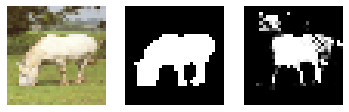

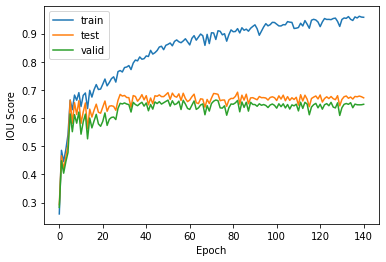

PT Gen Loss: 0.05859946087002754, Gen Loss: -47.94438934326172, Dis Loss: -1.6590995788574219, Adv Loss: -1.7582123279571533

epoch: 141
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.055005572736263275, Gen Loss: -46.401710510253906, Dis Loss: -1.6018036603927612, Adv Loss: -1.6909123659133911

epoch: 142
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.062208011746406555, Gen Loss: -45.601444244384766, Dis Loss: -1.6776946783065796, Adv Loss: -1.770796537399292

epoch: 143
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.05120076611638069, Gen Loss: -48.281455993652344, Dis Loss: -1.5851644277572

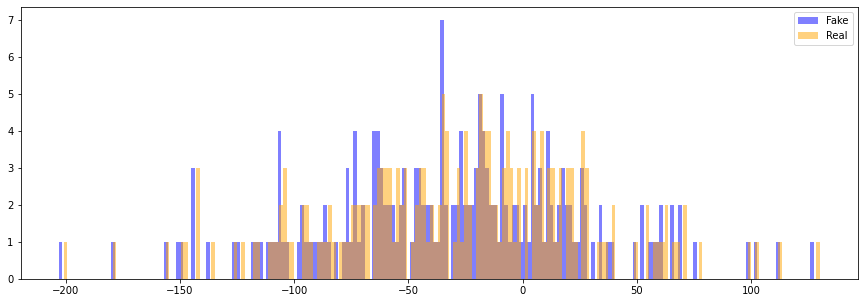


train iou_score %: 95.98


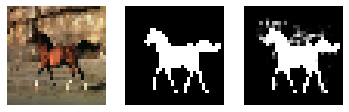

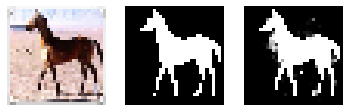

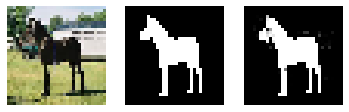

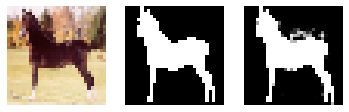

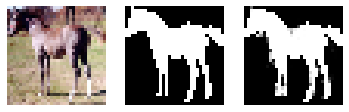

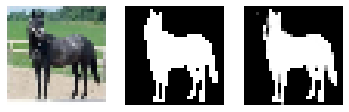

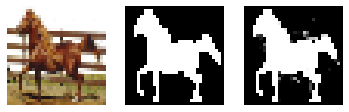

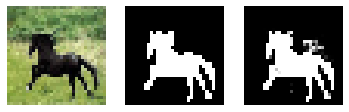

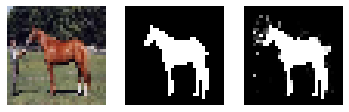

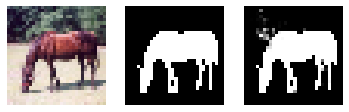


test iou_score %: 67.67


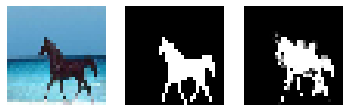

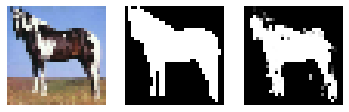

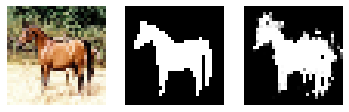

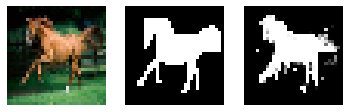

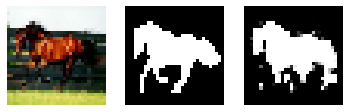

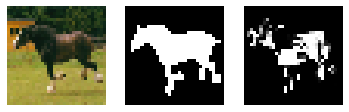

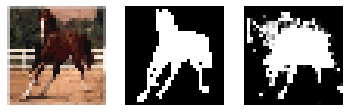

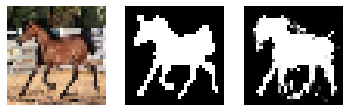

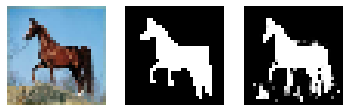

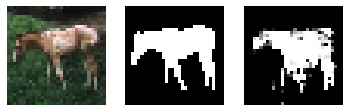


valid iou_score %: 64.84


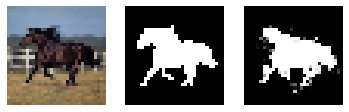

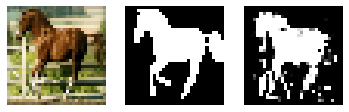

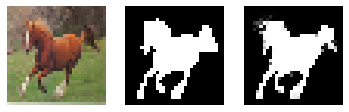

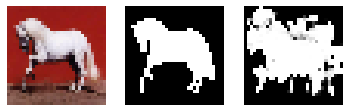

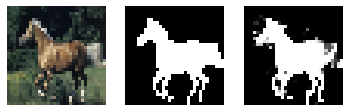

...

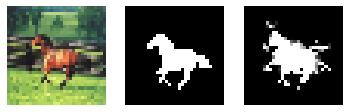

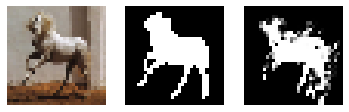

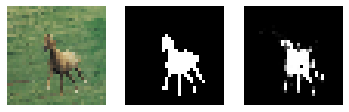

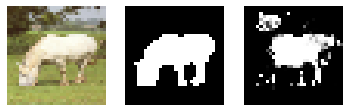

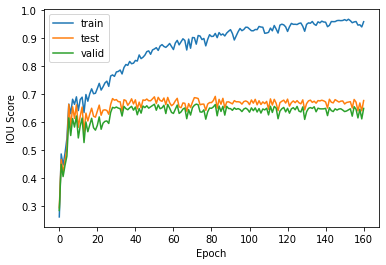

PT Gen Loss: 0.06751983612775803, Gen Loss: -30.25545883178711, Dis Loss: -1.5472683906555176, Adv Loss: -1.6377133131027222

epoch: 161
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.05225982144474983, Gen Loss: -35.17543029785156, Dis Loss: -1.4520620107650757, Adv Loss: -1.5400687456130981

epoch: 162
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.05069109797477722, Gen Loss: -41.106529235839844, Dis Loss: -1.439359188079834, Adv Loss: -1.5128754377365112

epoch: 163
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.05108841881155968, Gen Loss: -38.46098709106445, Dis Loss: -1.4619677066802979,

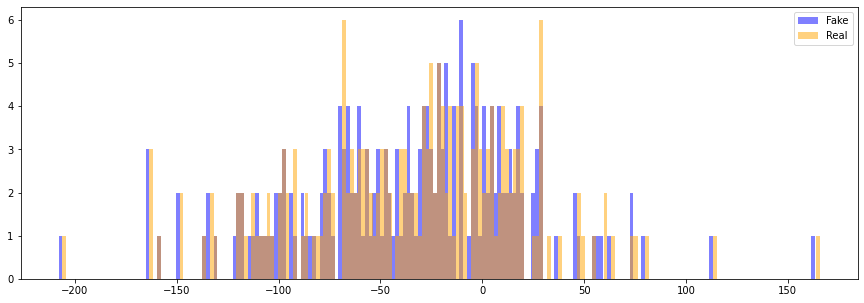


train iou_score %: 97.59


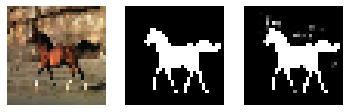

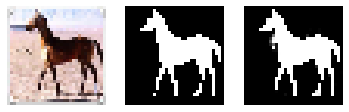

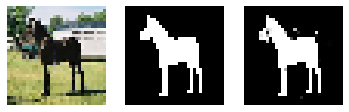

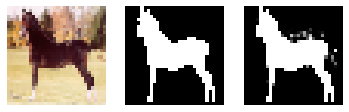

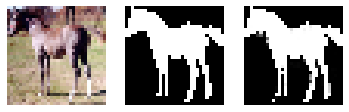

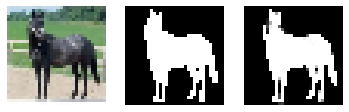

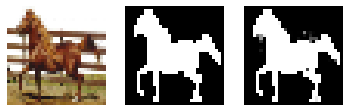

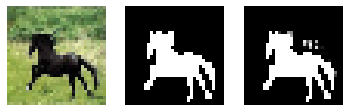

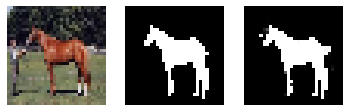

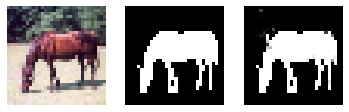


test iou_score %: 67.13


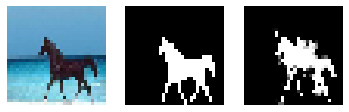

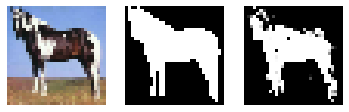

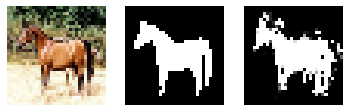

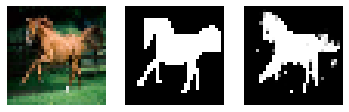

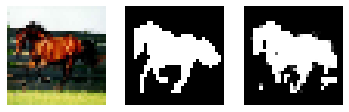

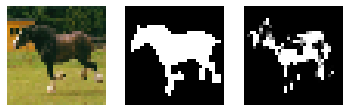

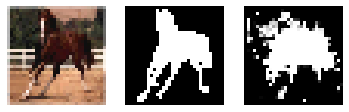

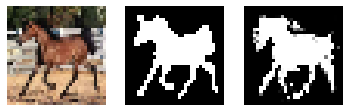

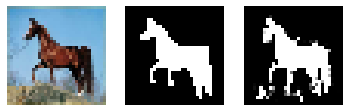

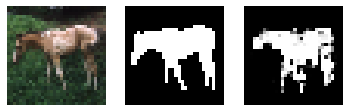


valid iou_score %: 64.55


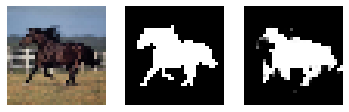

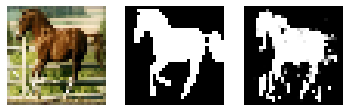

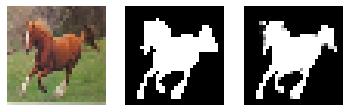

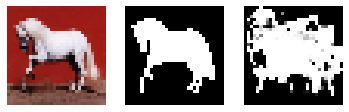

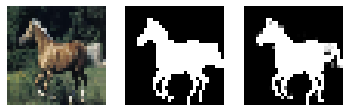

...

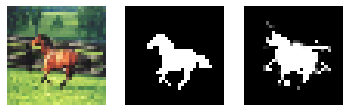

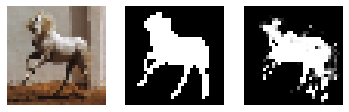

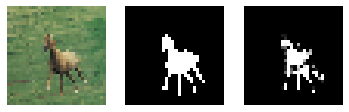

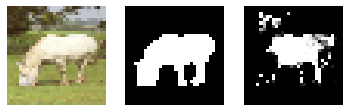

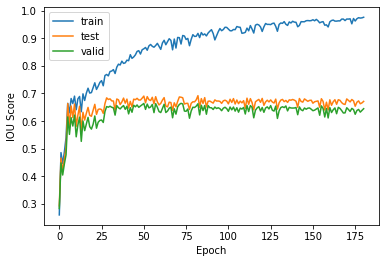

PT Gen Loss: 0.03743280470371246, Gen Loss: -35.895835876464844, Dis Loss: -1.2818505764007568, Adv Loss: -1.3415753841400146

epoch: 181
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.0374634750187397, Gen Loss: -42.46693420410156, Dis Loss: -1.2792396545410156, Adv Loss: -1.3394335508346558

epoch: 182
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.038997337222099304, Gen Loss: -39.546695709228516, Dis Loss: -1.240153193473816, Adv Loss: -1.2967612743377686

epoch: 183
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.0387808158993721, Gen Loss: -40.8065071105957, Dis Loss: -1.2926502227783203, 

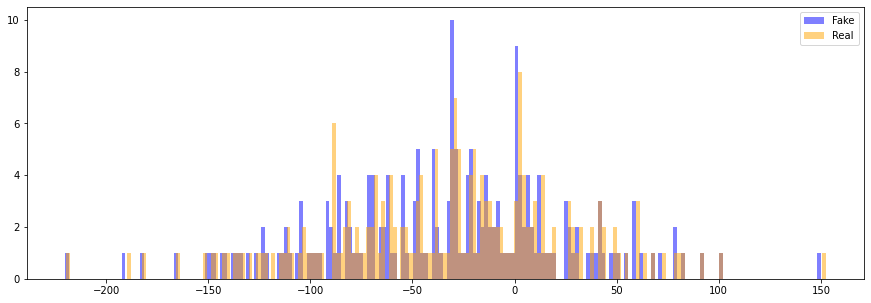


train iou_score %: 97.9


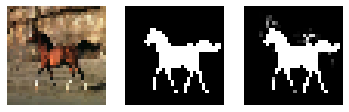

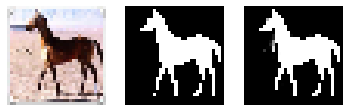

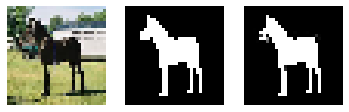

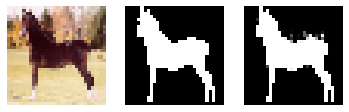

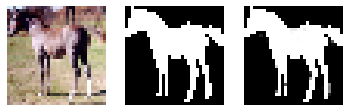

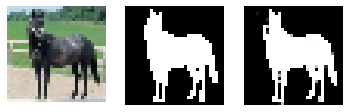

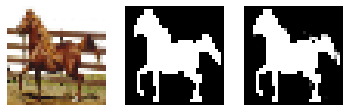

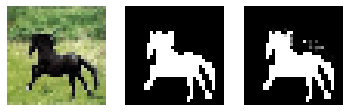

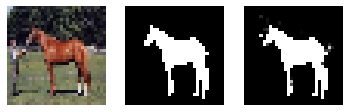

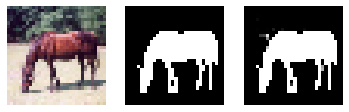


test iou_score %: 67.75


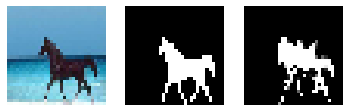

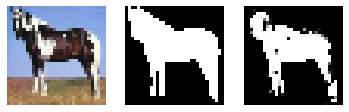

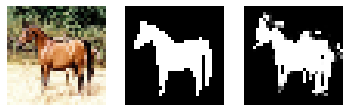

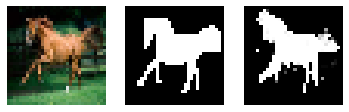

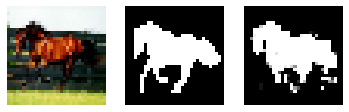

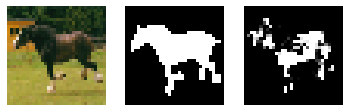

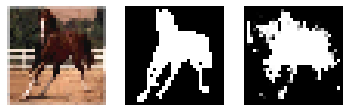

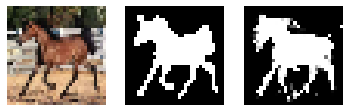

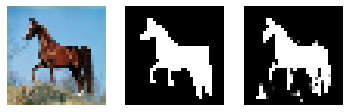

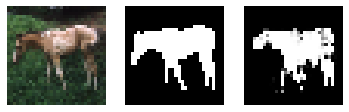


valid iou_score %: 64.39


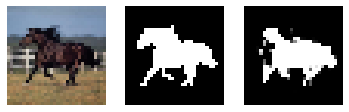

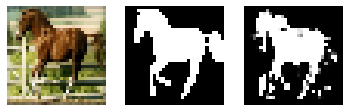

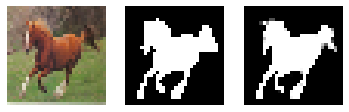

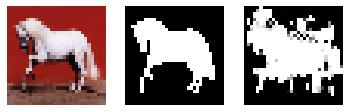

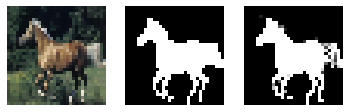

...

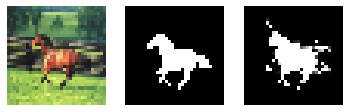

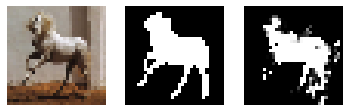

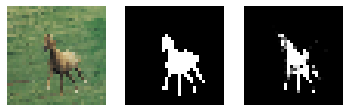

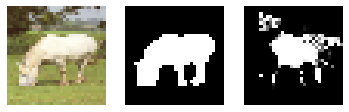

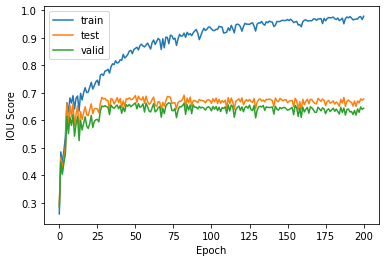

PT Gen Loss: 0.03650694712996483, Gen Loss: -35.140838623046875, Dis Loss: -1.1812297105789185, Adv Loss: -1.237159252166748

epoch: 201
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.030025217682123184, Gen Loss: -28.543386459350586, Dis Loss: -1.1209561824798584, Adv Loss: -1.1706801652908325

epoch: 202
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.030566997826099396, Gen Loss: -28.135709762573242, Dis Loss: -1.1545244455337524, Adv Loss: -1.2060221433639526

epoch: 203
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.030066659674048424, Gen Loss: -31.788066864013672, Dis Loss: -1.12847816944

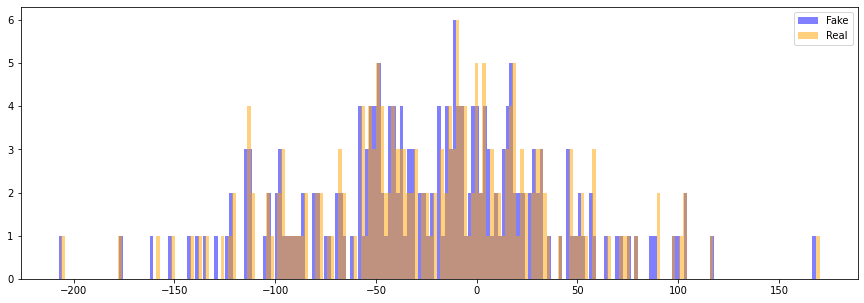


train iou_score %: 96.86


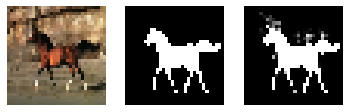

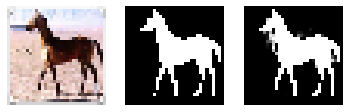

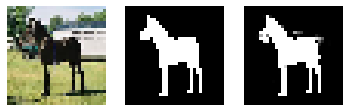

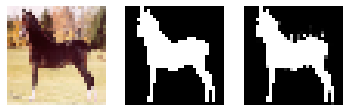

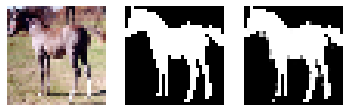

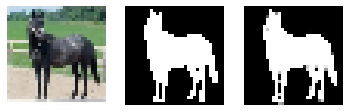

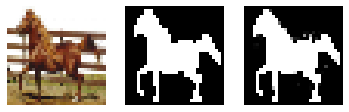

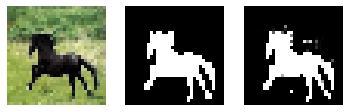

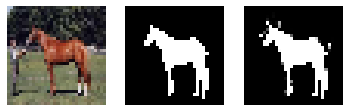

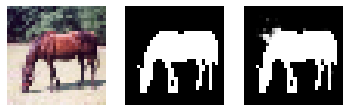


test iou_score %: 68.86


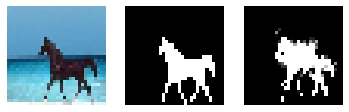

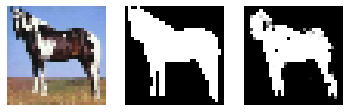

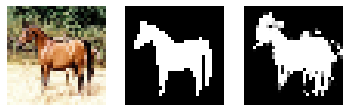

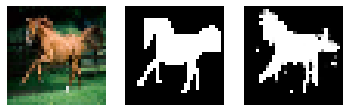

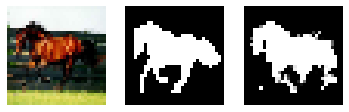

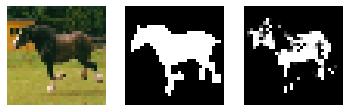

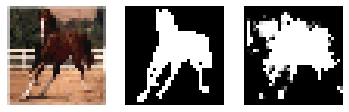

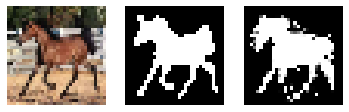

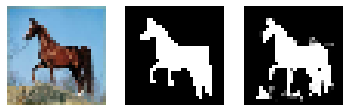

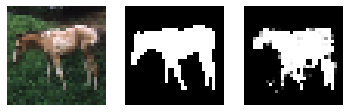


valid iou_score %: 65.17


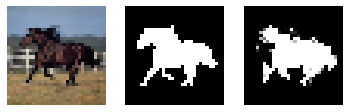

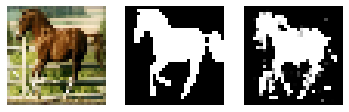

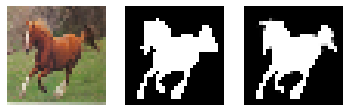

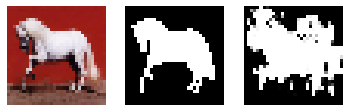

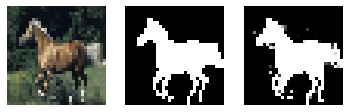

...

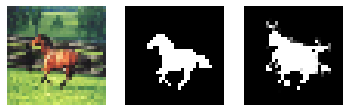

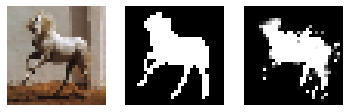

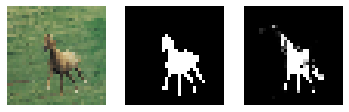

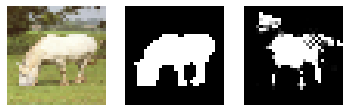

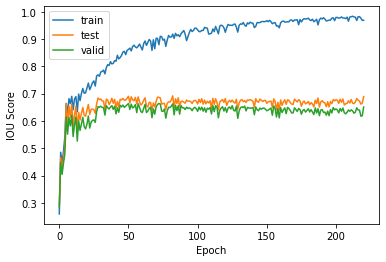

PT Gen Loss: 0.03822972625494003, Gen Loss: -24.0120849609375, Dis Loss: -1.1102746725082397, Adv Loss: -1.166817307472229

epoch: 221
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.03776286914944649, Gen Loss: -29.882593154907227, Dis Loss: -1.032766342163086, Adv Loss: -1.0837130546569824

epoch: 222
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.0318135991692543, Gen Loss: -26.771970748901367, Dis Loss: -0.9999009370803833, Adv Loss: -1.045806646347046

epoch: 223
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.027451064437627792, Gen Loss: -28.06401824951172, Dis Loss: -0.9899128675460815, A

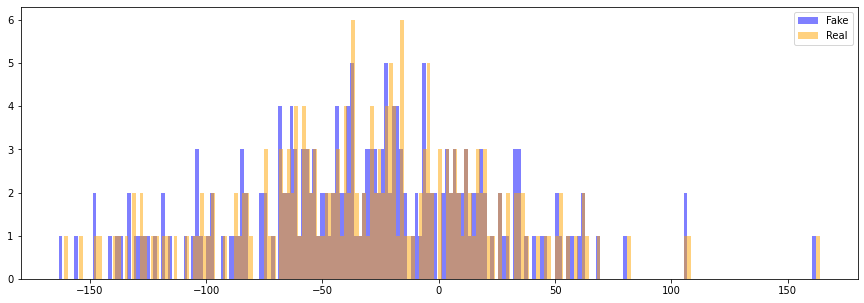


train iou_score %: 97.99


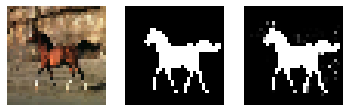

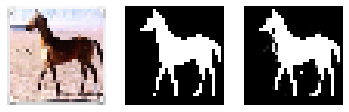

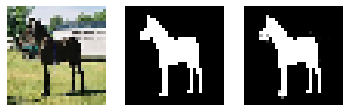

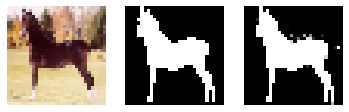

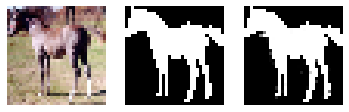

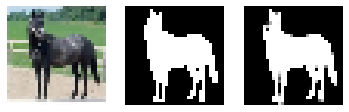

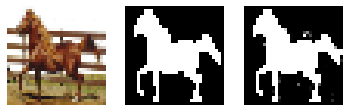

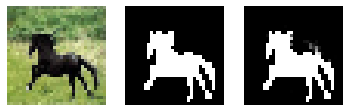

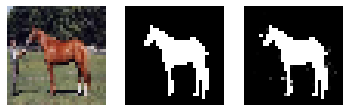

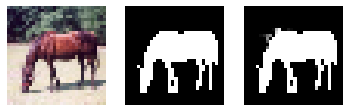


test iou_score %: 67.67


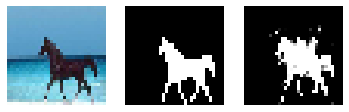

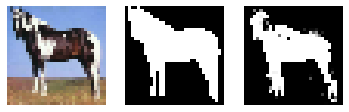

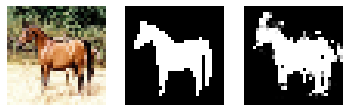

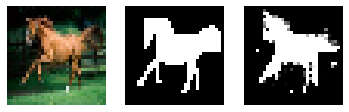

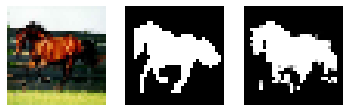

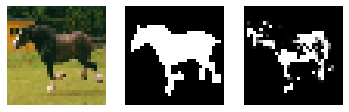

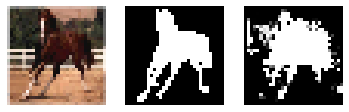

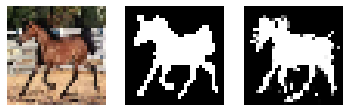

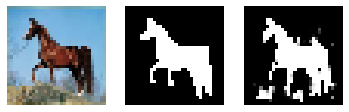

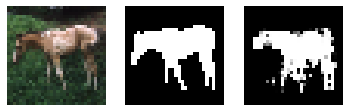


valid iou_score %: 63.61


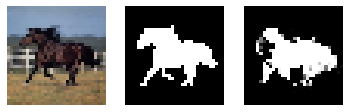

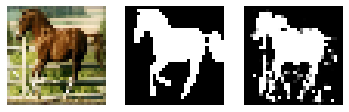

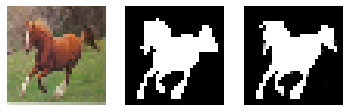

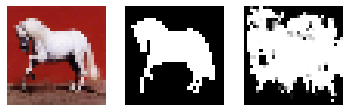

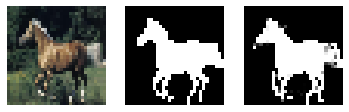

...

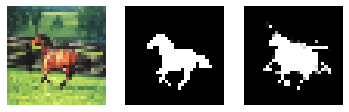

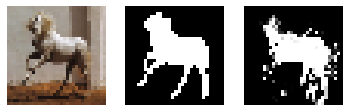

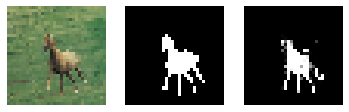

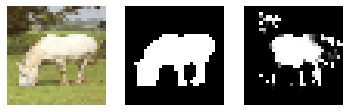

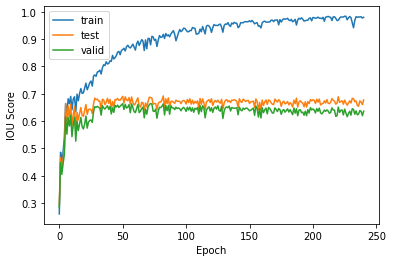

PT Gen Loss: 0.038434647023677826, Gen Loss: -31.93798065185547, Dis Loss: -0.982670783996582, Adv Loss: -1.029567837715149

epoch: 241
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.04280726984143257, Gen Loss: -27.79092788696289, Dis Loss: -1.0338376760482788, Adv Loss: -1.0893882513046265

epoch: 242
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.03692106902599335, Gen Loss: -23.394786834716797, Dis Loss: -1.0502139329910278, Adv Loss: -1.1062828302383423

epoch: 243
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.025025663897395134, Gen Loss: -28.6463623046875, Dis Loss: -0.962615430355072, 

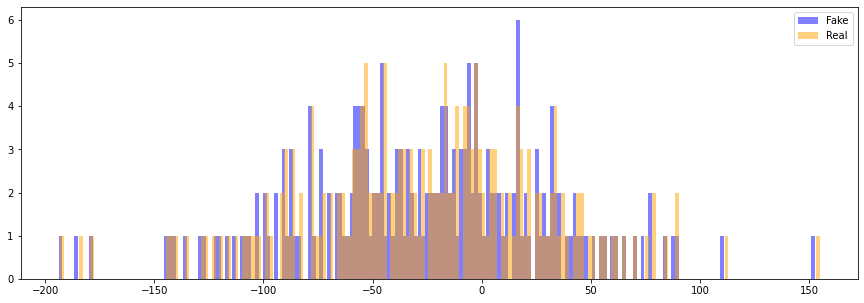


train iou_score %: 97.65


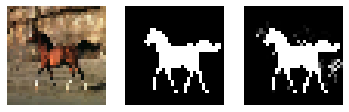

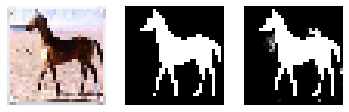

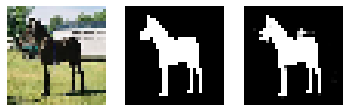

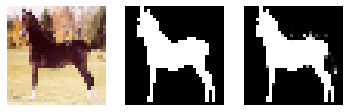

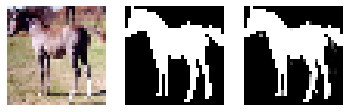

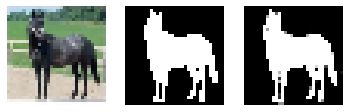

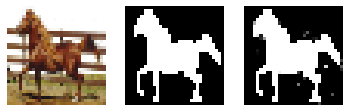

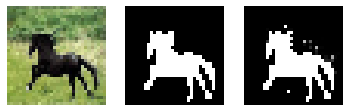

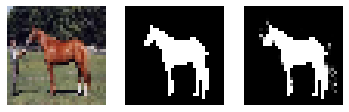

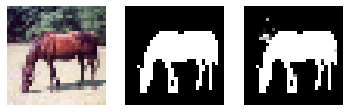


test iou_score %: 68.19


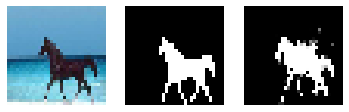

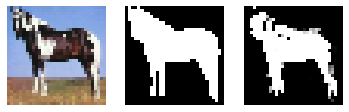

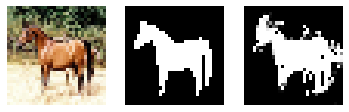

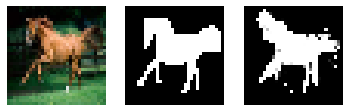

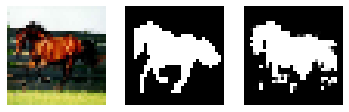

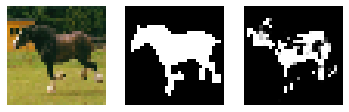

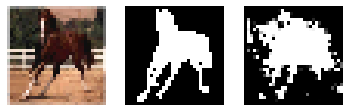

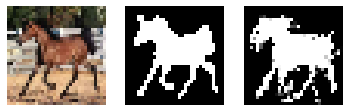

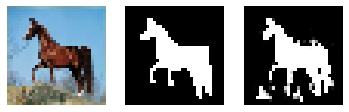

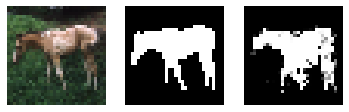


valid iou_score %: 64.06


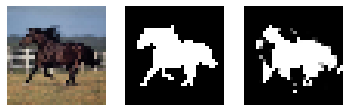

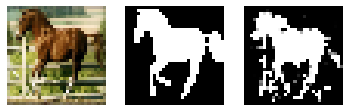

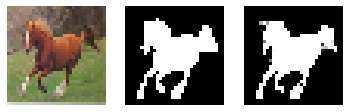

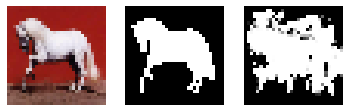

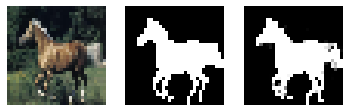

...

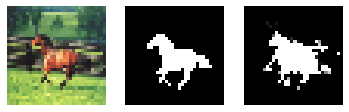

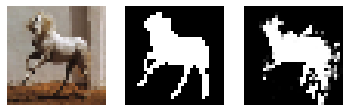

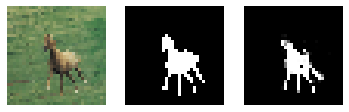

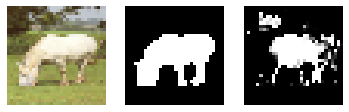

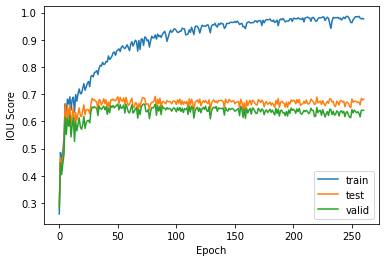

PT Gen Loss: 0.03134031966328621, Gen Loss: -25.50185775756836, Dis Loss: -0.9399436116218567, Adv Loss: -0.9795054793357849

epoch: 261
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.03415115177631378, Gen Loss: -32.363670349121094, Dis Loss: -0.9211889505386353, Adv Loss: -0.9646186232566833

epoch: 262
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.03379465639591217, Gen Loss: -30.2635498046875, Dis Loss: -0.9962608218193054, Adv Loss: -1.0431727170944214

epoch: 263
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.03585730493068695, Gen Loss: -47.68833541870117, Dis Loss: -1.0108164548873901,

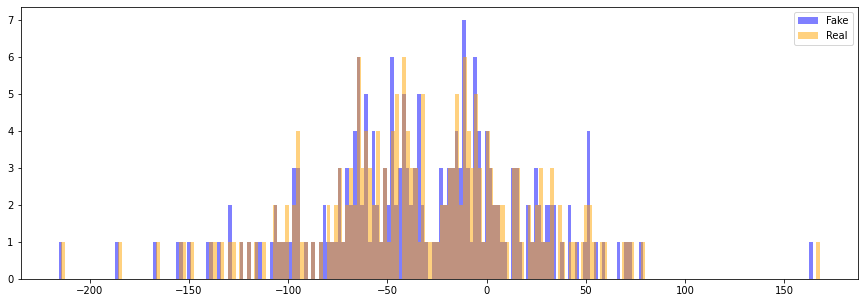


train iou_score %: 97.91


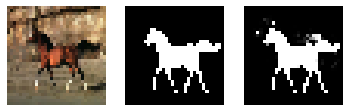

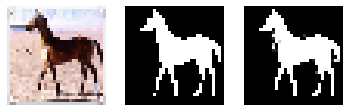

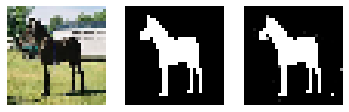

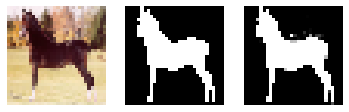

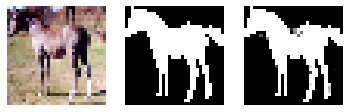

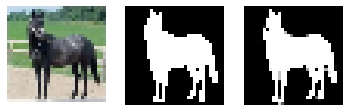

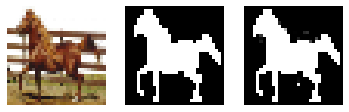

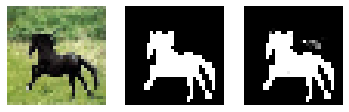

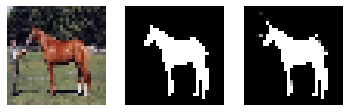

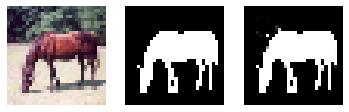


test iou_score %: 67.42


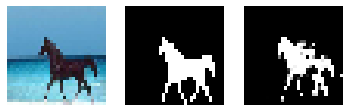

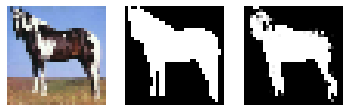

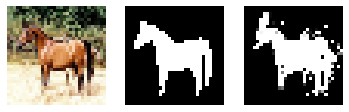

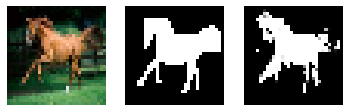

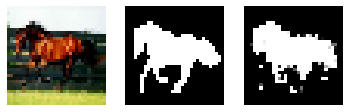

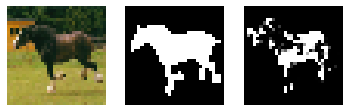

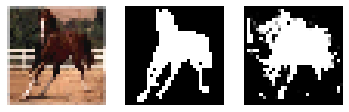

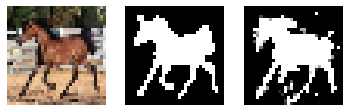

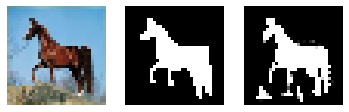

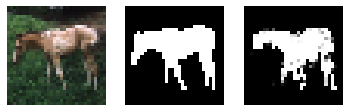


valid iou_score %: 63.55


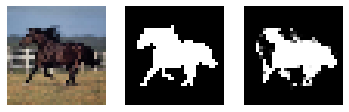

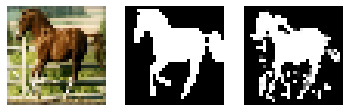

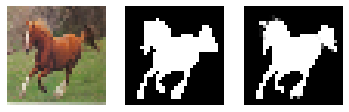

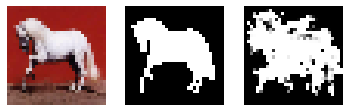

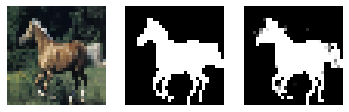

...

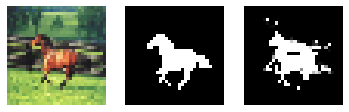

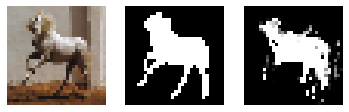

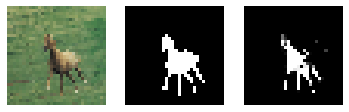

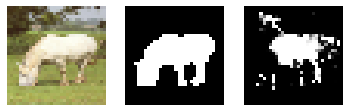

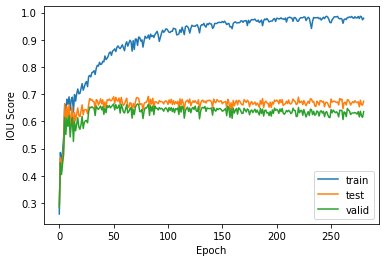

PT Gen Loss: 0.03840448334813118, Gen Loss: -33.73786163330078, Dis Loss: -0.979163646697998, Adv Loss: -1.0204811096191406

epoch: 281
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.028690127655863762, Gen Loss: -37.769596099853516, Dis Loss: -0.8921121954917908, Adv Loss: -0.931380033493042

epoch: 282
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.029134249314665794, Gen Loss: -32.00860595703125, Dis Loss: -0.8463822603225708, Adv Loss: -0.8855076432228088

epoch: 283
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 0.03642336279153824, Gen Loss: -30.62600326538086, Dis Loss: -0.9356658458709717

In [12]:
# general
batch_size = 8
n_epoch = 300
n_figs = 10

# disc
n_update_dis = 5
d_learning_rate = 0.0005

# pretrain gen
alpha = 0.01
pt_gen = True
pt_g_learning_rate = 0.001

# ebm gen
inf_iter = 10 #alpha
inf_rate = 2 #delta
g_learning_rate = 0.0005

##############################################################################################################

# create tf dataset generator object
N = len(xdata)
train_dataset = tf.data.Dataset.from_tensor_slices((xdata, ydata))
train_dataset = train_dataset.shuffle(buffer_size=N)
train_dataset = train_dataset.batch(batch_size=batch_size, drop_remainder=False)

# Initialize Networks
gen = Generator()
dis = Discriminator()

# Initialize Optimizer
gen_opt = tf.keras.optimizers.Adam(g_learning_rate)
gen_opt_pt = tf.keras.optimizers.Adam(pt_g_learning_rate)
dis_opt = tf.keras.optimizers.Adam(d_learning_rate)

# Initialize Metrics
adv_loss = tf.keras.metrics.Mean(name = 'Adversarial_Loss')
dis_loss = tf.keras.metrics.Mean(name = 'Discriminator_Loss')
gen_loss = tf.keras.metrics.Mean(name = 'Generator_Loss')
gen_pretrain_loss = tf.keras.metrics.Mean(name = 'Generator_Pretrain_Loss')

train(train_dataset, n_epoch, n_update_dis, inf_iter, inf_rate, pt_gen, alpha)

In [19]:
start, end, step = 0.0, 15.0, 30
plot_contour_ce(xtest, ytest, inf_iter, inf_rate, start, end, step)